# Data exploration

- Visualization of all training data, all testing data
- Visualization of 1500 additional training data

In [6]:
# https://ipython.org/ipython-doc/3/config/extensions/autoreload.html
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2

In [8]:
import sys
sys.path.append('../common')

In [9]:
from data_utils import type_1_ids, type_2_ids, type_3_ids, test_ids
from image_utils import get_image_data

In [10]:
import matplotlib.pylab as plt
%matplotlib inline

def plt_st(l1,l2):
    plt.figure(figsize=(l1,l2))

## Display all train images of Type_1, Type_2, Type_3

In [ ]:
tile_size = (256, 256)
n = 15

complete_images = []
for k, type_ids in enumerate([type_1_ids, type_2_ids, type_3_ids]):
    m = int(np.ceil(len(type_ids) * 1.0 / n))
    complete_image = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)
    train_ids = sorted(type_ids)
    counter = 0
    for i in range(m):
        ys = i*(tile_size[1] + 2)
        ye = ys + tile_size[1]
        for j in range(n):
            xs = j*(tile_size[0] + 2)
            xe = xs + tile_size[0]
            if counter == len(train_ids):
                break
            image_id = train_ids[counter]; counter+=1
            img = get_image_data(image_id, 'Type_%i' % (k+1))
            if img.dtype.kind != 'u':
                print("Corrupted image: ", image_id, 'Type_%i' % (k+1))
                continue
            img = cv2.resize(img, dsize=tile_size)
            img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 255), thickness=3)
            complete_image[ys:ye, xs:xe, :] = img[:,:,:]
        if counter == len(train_ids):
            break
    complete_images.append(complete_image)           

In [ ]:
plt_st(20, 20)
plt.imshow(complete_images[0])
plt.title("Training dataset of type %i" % (1))

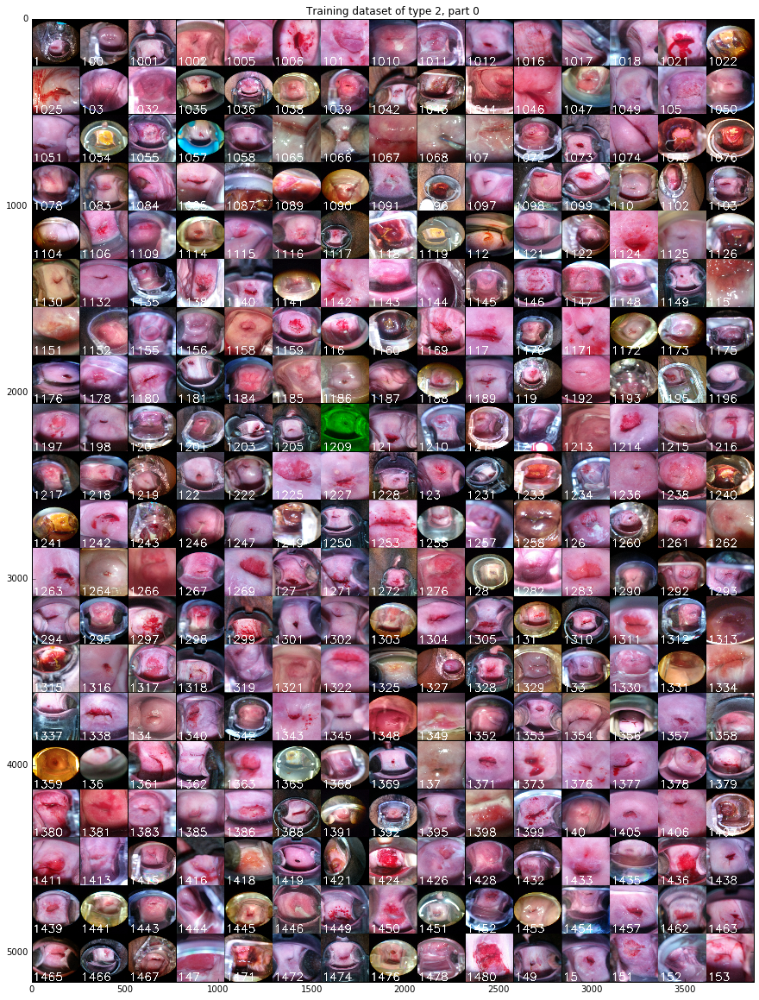

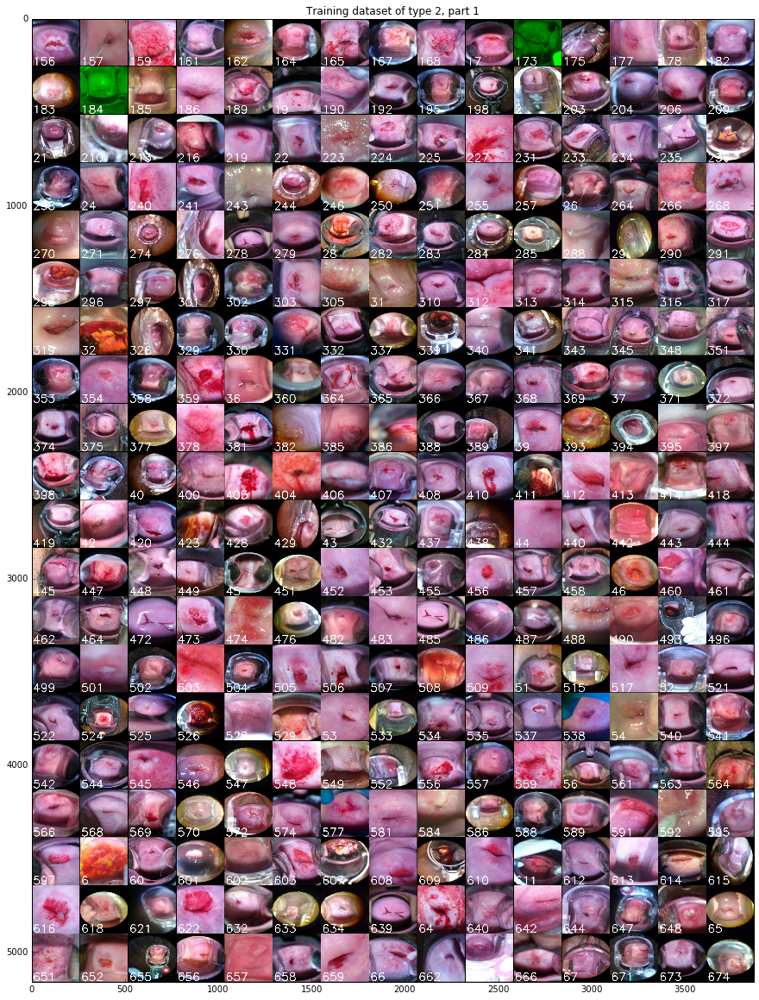

In [11]:
index = 1
m = complete_images[index].shape[0] / (tile_size[0] + 2)
n = int(np.ceil(m / 20))
for i in range(n):
    plt_st(20, 20)
    ys = i*(tile_size[0] + 2)*20
    ye = min((i+1)*(tile_size[0] + 2)*20, complete_images[index].shape[0])
    plt.imshow(complete_images[index][ys:ye,:,:])
    plt.title("Training dataset of type %i, part %i" % (index + 1, i))

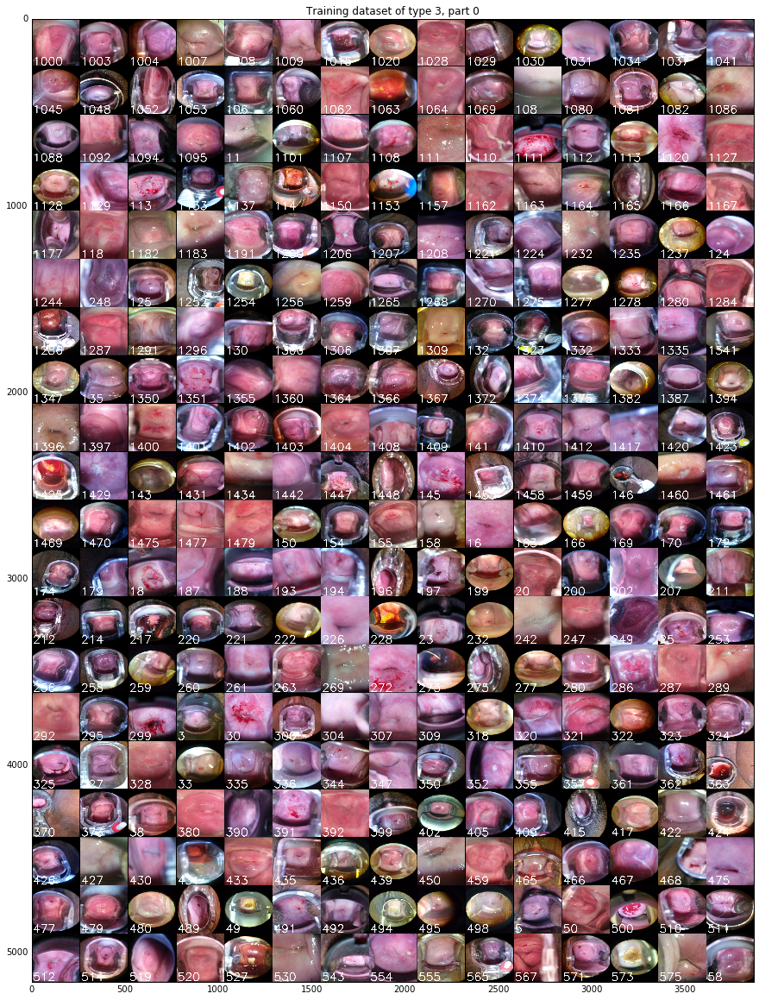

In [12]:
index = 2
m = complete_images[index].shape[0] / (tile_size[0] + 2)
n = int(np.ceil(m / 20))
for i in range(n):
    plt_st(20, 20)
    ys = i*(tile_size[0] + 2)*20
    ye = min((i+1)*(tile_size[0] + 2)*20, complete_images[index].shape[0])
    plt.imshow(complete_images[index][ys:ye,:,:])
    plt.title("Training dataset of type %i, part %i" % (index + 1, i))

## Display all test images

In [ ]:
tile_size = (256, 256)
n = 15
m = int(np.ceil(len(test_ids) * 1.0 / n))
complete_test_image = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)
counter = 0
for i in range(m):
    ys = i*(tile_size[1] + 2)
    ye = ys + tile_size[1]
    for j in range(n):
        xs = j*(tile_size[0] + 2)
        xe = xs + tile_size[0]
        if counter == len(test_ids):
            break
        image_id = test_ids[counter]; counter+=1
        img = get_image_data(image_id, 'Test')
        img = cv2.resize(img, dsize=tile_size)
        img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 255), thickness=3)
        complete_test_image[ys:ye, xs:xe, :] = img[:,:,:]
    if counter == len(test_ids):
        break


In [ ]:
m = complete_test_image.shape[0] / (tile_size[0] + 2)
n = int(np.ceil(m / 20))
for i in range(n):
    plt_st(20, 20)
    ys = i*(tile_size[0] + 2)*20
    ye = min((i+1)*(tile_size[0] + 2)*20, complete_test_image.shape[0])
    plt.imshow(complete_test_image[ys:ye,:,:])
    plt.title("Test dataset, part %i" % (i))

## Extract cervix part from images

In [104]:
img_1 = get_image_data('1023', 'Type_1')
img_2 = get_image_data('531', 'Type_1')
img_3 = get_image_data('596', 'Type_1')
img_4 = get_image_data('1061', 'Type_1')
img_5 = get_image_data('1365', 'Type_2')
img_6 = get_image_data('0', 'Type_1')
img_7 = get_image_data('10', 'Type_1')

In [79]:
def rgb2hsv(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)


def dark_pixels_index(img, t):
    v = rgb2hsv(img)[:,:,2]
    v[v >= t] = 255
    v[v < t] = 0
    return v

In [22]:
templates_filename = '../input/generated/templates.csv'

if not os.path.exists(templates_filename):
    template_image_id_type_list = []
    nb_bright_pixels_factor = 0.975

    type_ids=(type_1_ids, type_2_ids, type_3_ids)
    image_types = ["Type_1", "Type_2", "Type_3"]
    counter = 0
    for ids, image_type in zip(type_ids, image_types):
        print('--', image_type)
        for image_id in ids:
            img = get_image_data(image_id, image_type)
            if img.dtype.kind is not 'u':
                continue
            img = cv2.resize(img, dsize=(512, 512))
            dp = dark_pixels_index(img, 90)
            nb_bright_pixels = cv2.countNonZero(dp)
            if nb_bright_pixels > nb_bright_pixels_factor * img.shape[0] * img.shape[1]:
                template_image_id_type_list.append((image_id, image_type))  

    print(len(template_image_id_type_list))
    df = pd.DataFrame(template_image_id_type_list, columns=['Image_id', 'Image_type'])
    df.to_csv(templates_filename, index=False)
else:
    df = pd.read_csv(templates_filename, dtype={'Image_id': str})
    template_image_id_type_list = df[['Image_id', 'Image_type']].values.tolist()

In [24]:
tile_size = (256, 256)
n = 15
m = int(np.ceil(len(template_image_id_type_list) * 1.0 / n))
complete_template_image = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)
counter = 0
for i in range(m):
    ys = i*(tile_size[1] + 2)
    ye = ys + tile_size[1]
    for j in range(n):
        xs = j*(tile_size[0] + 2)
        xe = xs + tile_size[0]
        if counter == len(template_image_id_type_list):
            break
        image_id, image_type  = template_image_id_type_list[counter]; counter+=1
        img = get_image_data(image_id, image_type)
        img = cv2.resize(img, dsize=tile_size)
        img = cv2.putText(img, image_id + " | " + image_type, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), thickness=2)
        complete_template_image[ys:ye, xs:xe, :] = img[:,:,:]
    if counter == len(template_image_id_type_list):
        break


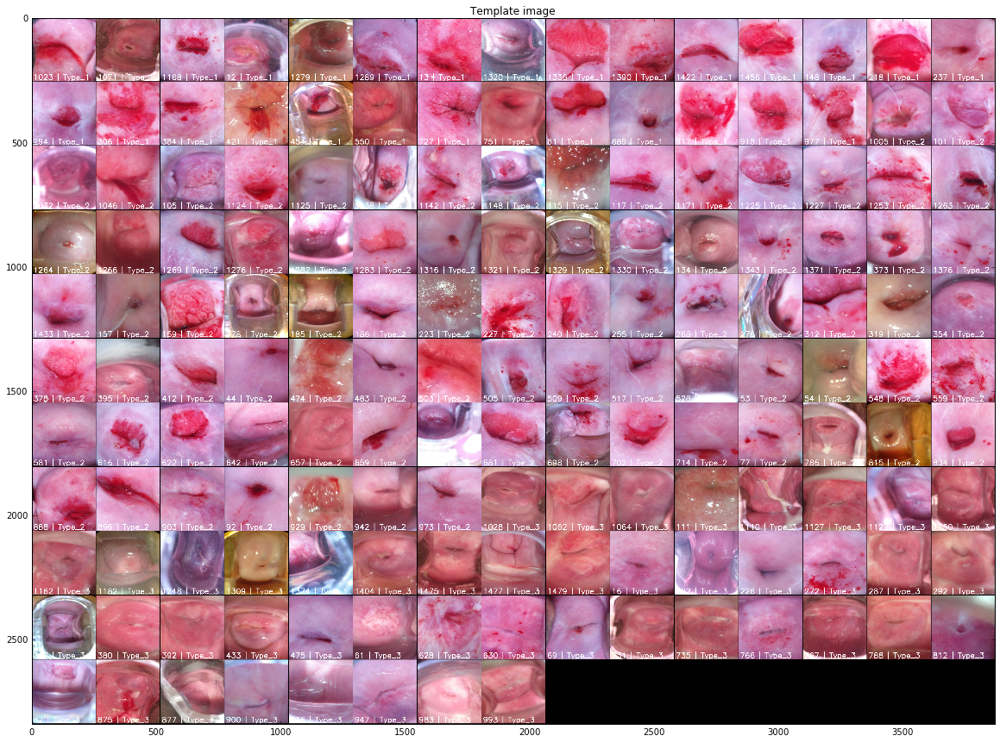

In [25]:
plt_st(20, 20)
plt.imshow(complete_template_image)
plt.title("Template image")

In [66]:
canny_threshold = 30
canny_ratio = 5.0

def contours(image):
   proc = cv2.medianBlur(image, 5)    
   proc = cv2.Canny(proc, canny_threshold, canny_ratio*canny_threshold)   
   return proc

def sieve(image, size):
    """
    Filter removes small objects of 'size' from binary image
    Input image should be a single band image of type np.uint8
    Idea : use Opencv findContours
    """
    sqLimit = size**2
    linLimit = size*4
    outImage = image.copy()
    image, contours, hierarchy = cv2.findContours(image.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if len(hierarchy) > 0:
        hierarchy = hierarchy[0]
        index = 0
        while index >= 0:
            contour = contours[index]
            p = cv2.arcLength(contour, True)
            s = cv2.contourArea(contour)
            r = cv2.boundingRect(contour)
            if s <= sqLimit and p <= linLimit:
                outImage[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] = 0
            index = hierarchy[index][0]
    else:
        pass
        # print("No contours found")
    return outImage


# in HSV :
skin_range_1_min = np.array([120, 0, 0], dtype=np.uint8)
skin_range_1_max = np.array([255, 255, 255], dtype=np.uint8)

skin_range_2_min = np.array([0, 0, 0], dtype=np.uint8)
skin_range_2_max = np.array([45, 255, 255], dtype=np.uint8)

skin_kernel_size = 7
skin_sieve_min_size = 5

def detect_skin(image):
    proc = cv2.medianBlur(image, 7)
    ### Detect skin
    image_hsv = cv2.cvtColor(proc, cv2.COLOR_RGB2HSV)
    skin_like_mask = cv2.inRange(image_hsv, skin_range_1_min, skin_range_1_max)
    skin_like_mask_2 = cv2.inRange(image_hsv, skin_range_2_min, skin_range_2_max)
    skin_like_mask = cv2.bitwise_or(skin_like_mask, skin_like_mask_2)    
    # Filter the skin mask :
    skin_mask = sieve(skin_like_mask, skin_sieve_min_size)
    kernel = np.ones((skin_kernel_size, skin_kernel_size), dtype=np.int8)
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel)    
    # Apply skin mask
    skin_segm_rgb = cv2.bitwise_and(image, image, mask=skin_mask)
    return skin_segm_rgb

In [81]:
counter = 0

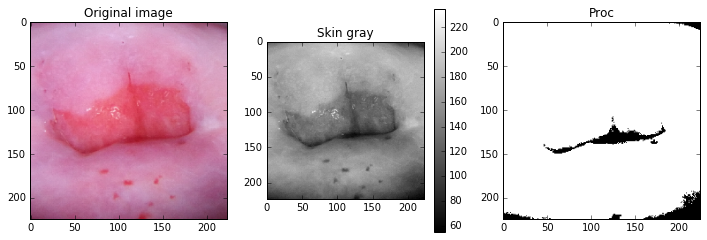

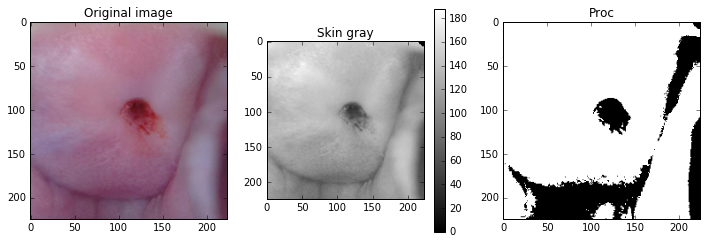

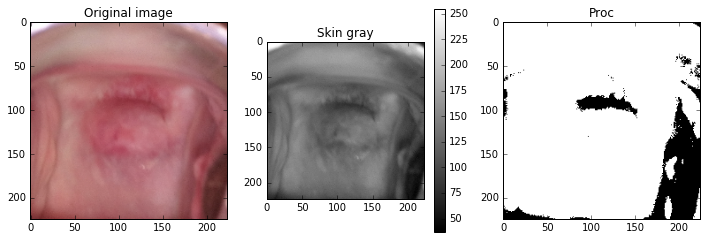

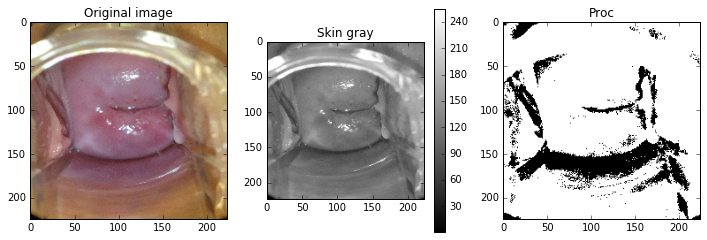

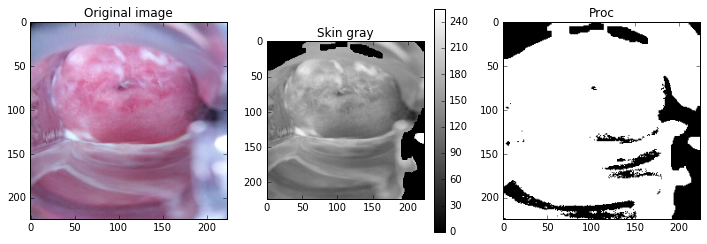

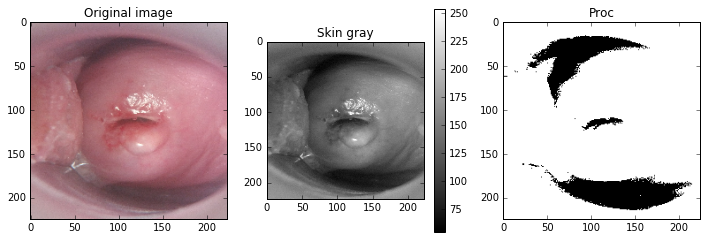

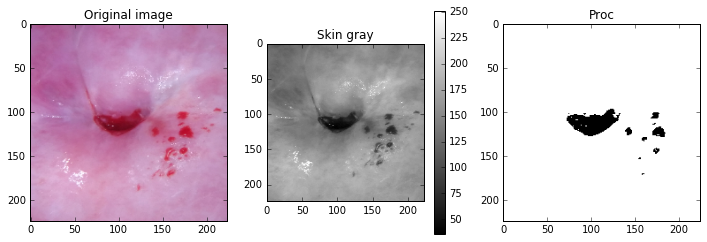

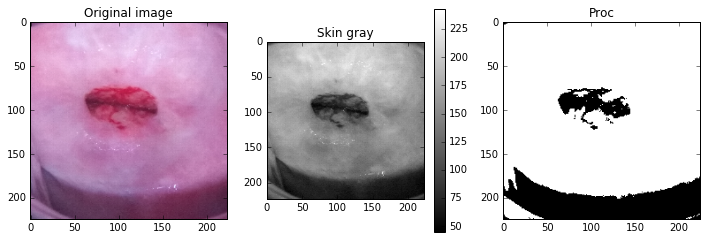

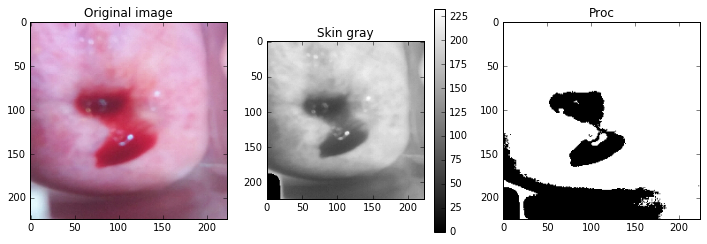

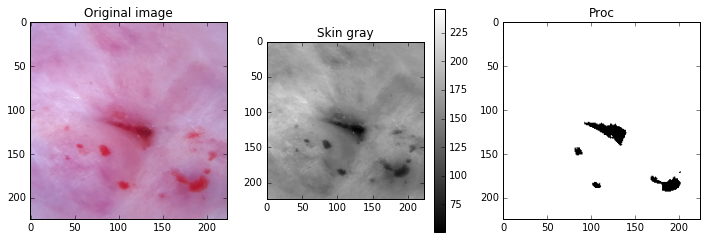

In [87]:
for image_id, image_type in template_image_id_type_list[counter:]:
    img = get_image_data(image_id, image_type)
    img = cv2.resize(img, dsize=image_size)    
    skin_segmentation = detect_skin(img)
    gray = cv2.cvtColor(skin_segmentation, cv2.COLOR_RGB2GRAY)
    proc = gray.copy()
    proc[proc >= 100] = 255
    proc[proc < 100] = 0    

#     proc = contours(skin_segmentation)

    plt_st(12, 4)
    plt.subplot(131)
    plt.imshow(img)
    plt.title("Original image")
    
    plt.subplot(132)
    plt.imshow(gray, cmap='gray')
    plt.title("Skin gray")
    plt.colorbar()

    plt.subplot(133)
    plt.imshow(proc, cmap='gray')
    plt.title("Proc")

    counter += 1
    if counter % 10 == 0:
        break


In [32]:
image_size = (224, 224)
mean_template_image = np.zeros(image_size[::-1] + (3,), dtype=np.float32)

for image_id, image_type in template_image_id_type_list:
    img = get_image_data(image_id, image_type)
    img = cv2.resize(img, dsize=image_size)
    mean_template_image += img.astype(np.float32)

mean_template_image *= 1.0/len(template_image_id_type_list)

In [33]:
mean_template_image.shape, mean_template_image.dtype, mean_template_image.min(), mean_template_image.max()

((224, 224, 3), dtype('float32'), 85.803802, 206.48102)

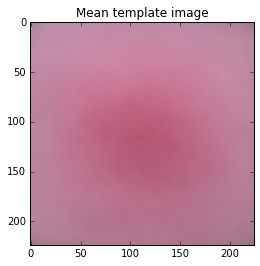

In [34]:
plt_st(12, 4)
plt.imshow((mean_template_image).astype(np.uint8))
plt.title("Mean template image")

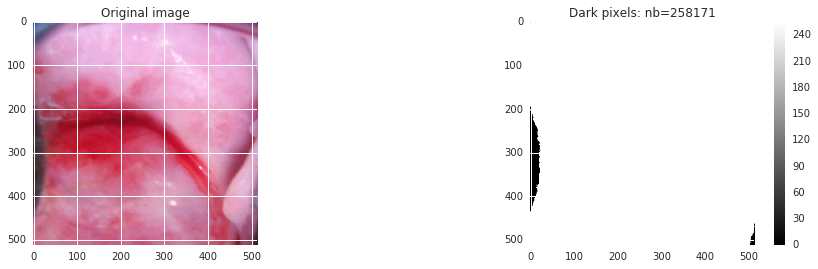

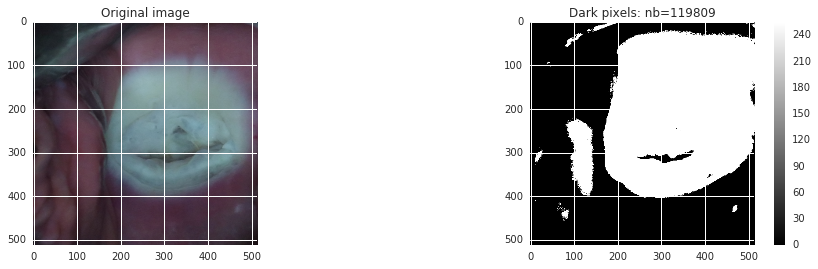

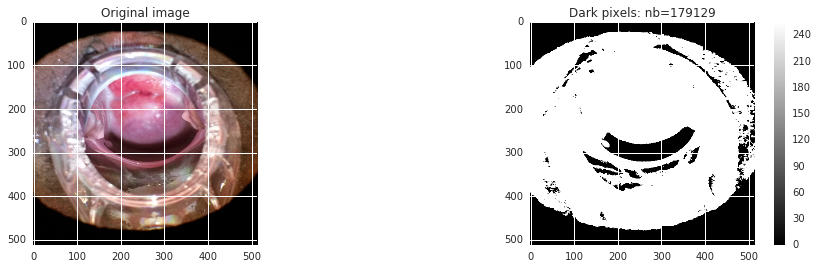

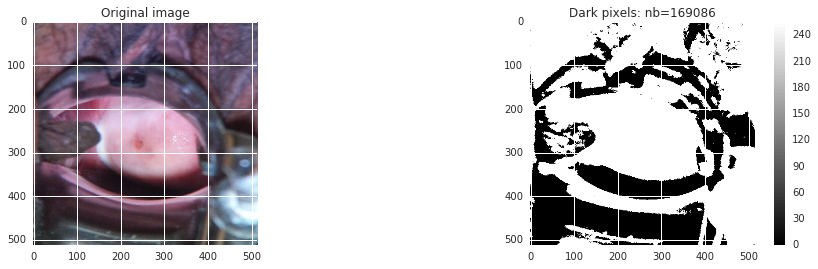

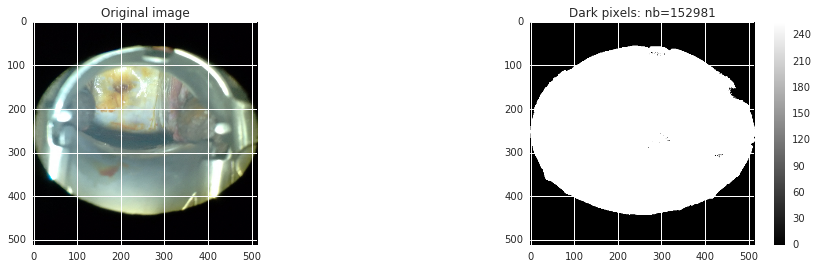

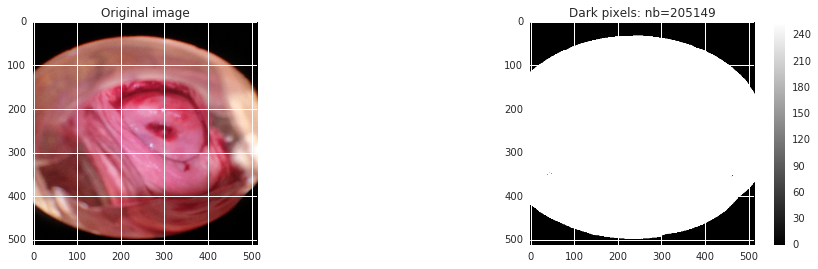

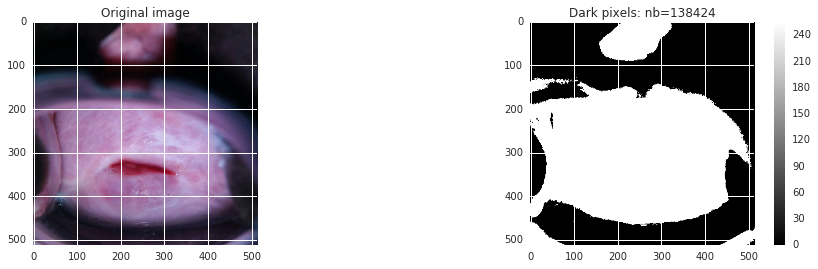

In [113]:
for image in [img_1, img_2, img_3, img_4, img_5, img_6, img_7]:       
    image = cv2.resize(image, dsize=(512, 512))
    dark_pixels = dark_pixels_index(image, 90)
    plt_st(16, 4)
    plt.subplot(121)
    plt.title("Original image")    
    plt.imshow(image)
    plt.subplot(122)
    plt.title("Dark pixels: nb=%i" % cv2.countNonZero(dark_pixels))
    plt.imshow(dark_pixels, cmap='gray')
    plt.colorbar()


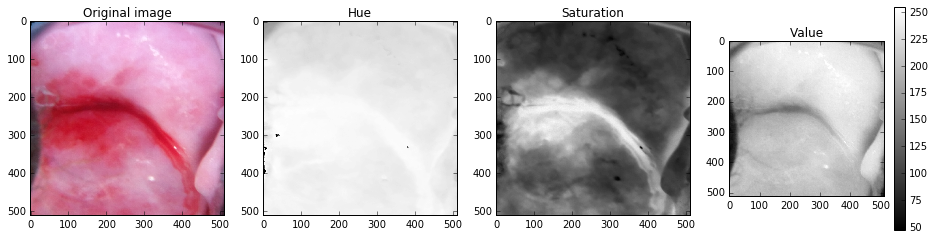

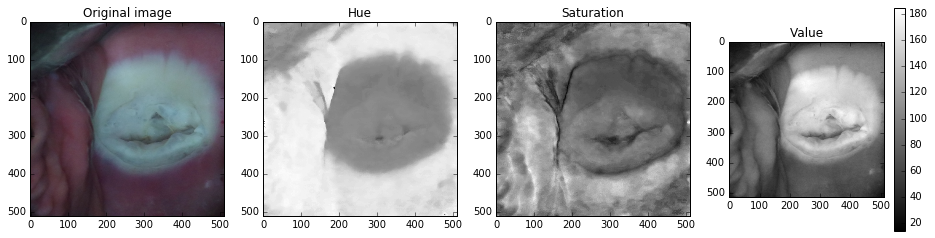

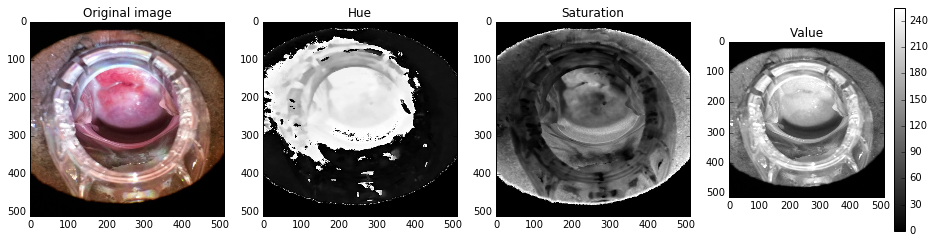

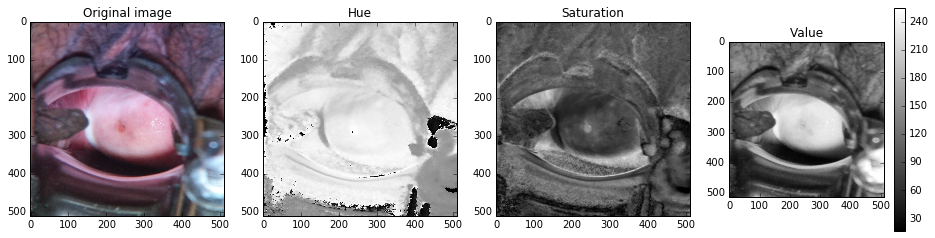

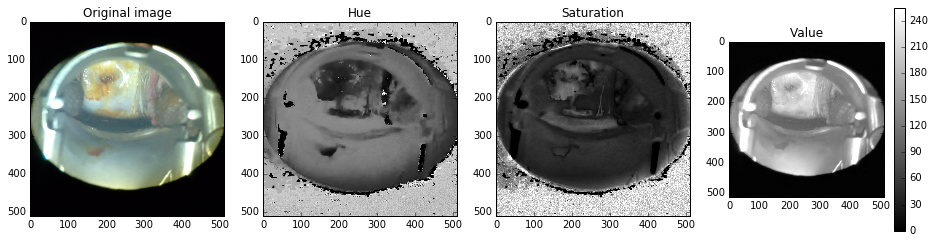

In [19]:
for image in [img_1, img_2, img_3, img_4, img_5]:       
    image = cv2.resize(image, dsize=(512, 512))
    hsv = rgb2hsv(image)
    plt_st(16, 4)
    plt.subplot(141)
    plt.title("Original image")    
    plt.imshow(image)
    plt.subplot(142)
    plt.title("Hue")
    plt.imshow(hsv[:,:,0], cmap='gray')
    plt.subplot(143)
    plt.title("Saturation")
    plt.imshow(hsv[:,:,1], cmap='gray')
    plt.subplot(144)
    plt.title("Value")
    plt.imshow(hsv[:,:,2], cmap='gray')
    plt.colorbar()


In [6]:
from PIL import Image
from image_utils import _get_image_data_pil

In [ ]:
img_1 = get_image_data('1023', 'Type_1')
img_2 = get_image_data('531', 'Type_1')
img_3 = get_image_data('596', 'Type_1')
img_4 = get_image_data('1061', 'Type_1')
img_5 = get_image_data('1365', 'Type_2')

In [9]:
img, exif_data = _get_image_data_pil('531', 'Type_1', return_exif_md=True)
exif_data

{271: u'Motorola',
 272: u'MotoG3',
 282: (72, 1),
 283: (72, 1),
 296: 2,
 306: u'2016:12:10 09:52:09',
 531: 1,
 33434: (3001, 100000),
 33437: (200000, 100000),
 34665: 176,
 34850: 2,
 34853: {0: '\x02\x02\x00\x00', 18: u'WGS-84'},
 34855: 125,
 36864: '0220',
 36867: u'2016:12:10 09:52:09',
 36868: u'2016:12:10 09:52:09',
 37121: '\x01\x02\x03\x00',
 37377: (505, 100),
 37378: (200000, 100000),
 37379: (-1, 1),
 37380: (0, 1),
 37381: (200000, 100000),
 37383: 2,
 37385: 16,
 37386: (3640, 1000),
 37500: 'MOT\x00\x01\x01\x01\x01\x00nU\x00\x00\x02\x00\x00\x00\x0f\x00\x00\x056U\x01\x00\x02\x00\x00\x00\x0b\x00\x00\x05Eq\x00\x00\x02\x00\x00\x00\x040-3\x00q\x01\x00\x02\x00\x00\x00\x040-3\x00q\x02\x00\x02\x00\x00\x00\x01\x00\x00\x00\x00q\x03\x00\x02\x00\x00\x00#\x00\x00\x05Pq\x04\x00\x02\x00\x00\x00#\x00\x00\x05sU\x02\x00\x01\x00\x00\x00\x015\x00\x00\x00U\x03\x00\x01\x00\x00\x00\x01\x19\x00\x00\x00U\x10\x00\x01\x00\x00\x00\x01\x01\x00\x00\x00U\x80\x00\t\x00\x00\x00\x01\x00\x00:\x98U\x90

In [27]:
img, exif_data = _get_image_data_pil('596', 'Type_1', return_exif_md=True)
exif_data

In [84]:
exif_stats = pd.DataFrame(columns=['Image_id', 'Image_type', 'Camera_name', 'Camera_type', 'Datetime', 'ISO'])

In [85]:
type_ids=(type_1_ids, type_2_ids, type_3_ids, test_ids)
image_types = ["Type_1", "Type_2", "Type_3", "Test"]

ll = 300
counter = 0
for ids, image_type in zip(type_ids, image_types):
    print('--', image_type)
    for image_id in ids[:ll]:
        img, exif_data = _get_image_data_pil(image_id, image_type, return_exif_md=True)
        if isinstance(exif_data, dict):
            exif_stats.loc[counter, :] = [image_id, image_type, 
                                          exif_data[271], 
                                          exif_data[272], 
                                          exif_data[306],
                                          exif_data[34855]] 
        else:            
            exif_stats.loc[counter, :] = [image_id, image_type, 
                                          'NA', 
                                          'NA', 
                                          'NA', 
                                          'NA'] 
        counter+=1

('--', 'Type_1')
('--', 'Type_2')
('--', 'Type_3')
('--', 'Test')


/usr/local/lib/python2.7/site-packages/PIL/TiffImagePlugin.py:680: UserWarning: Possibly corrupt EXIF data.  Expecting to read 654901248 bytes but only got 0. Skipping tag 4
  "Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python2.7/site-packages/PIL/TiffImagePlugin.py:680: UserWarning: Possibly corrupt EXIF data.  Expecting to read 205914112 bytes but only got 13135. Skipping tag 4
  "Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python2.7/site-packages/PIL/TiffImagePlugin.py:680: UserWarning: Possibly corrupt EXIF data.  Expecting to read 513671168 bytes but only got 0. Skipping tag 4
  "Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python2.7/site-packages/PIL/TiffImagePlugin.py:680: UserWarning: Possibly corrupt EXIF data.  Expecting to read 205914112 bytes but only got 10980. Skipping tag 4
  "Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python2.7/site-packages/PIL/TiffImagePlugin.py:680: UserWarning: Possibly corrupt EXIF data.  Exp

In [86]:
exif_stats['Camera_name'] = exif_stats['Camera_name'].str.lower()
exif_stats['YMD'] = exif_stats['Datetime'].apply(lambda x: x[:10])
data_mask = exif_stats['Camera_name'] != 'na'

In [87]:
exif_stats.head(10)

,Image_id,Image_type,Camera_name,Camera_type,Datetime,ISO,YMD
0,0,Type_1,na,NA,NA,NA,NA
1,10,Type_1,na,NA,NA,NA,NA
2,1013,Type_1,na,NA,NA,NA,NA
3,1014,Type_1,na,NA,NA,NA,NA
4,1019,Type_1,samsung,SM-J500H,2016:12:02 19:03:37,250,2016:12:02
5,102,Type_1,na,NA,NA,NA,NA
6,1023,Type_1,samsung,SM-J500H,2016:06:23 12:43:01,200,2016:06:23
7,1024,Type_1,na,NA,NA,NA,NA
8,1026,Type_1,na,NA,NA,NA,NA
9,1027,Type_1,na,NA,NA,NA,NA


In [59]:
import seaborn as sns

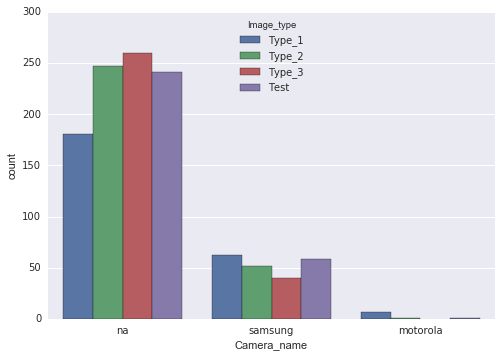

In [89]:
sns.countplot(data=exif_stats, x='Camera_name', hue='Image_type')
# exif_stats['Camera_name'].value_counts().plot(kind='barh')

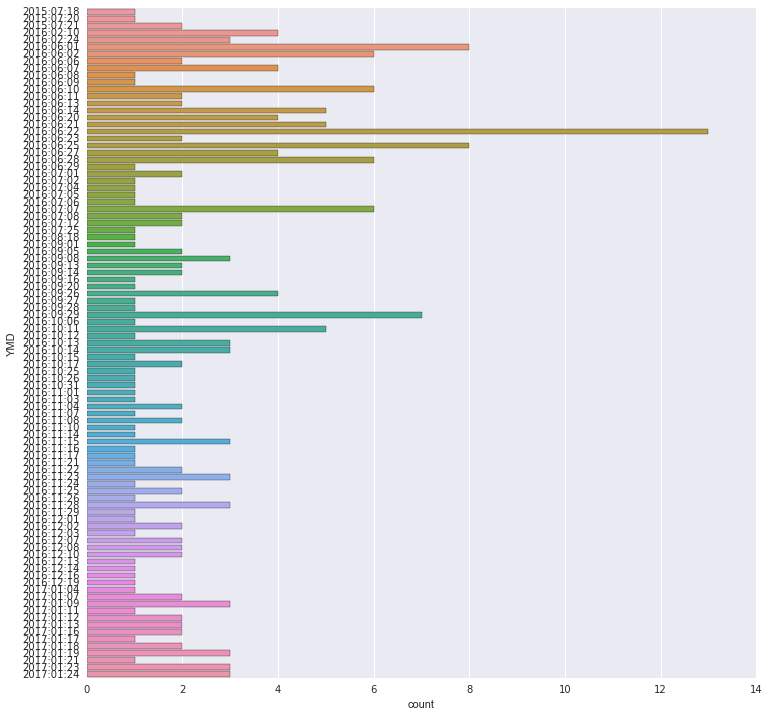

In [92]:
plt_st(12, 12)
sns.countplot(data=exif_stats[data_mask].sort_values(['YMD']), y='YMD')